<a href="https://colab.research.google.com/github/lukazlatecan/bee_pollen_detector/blob/master/BeePollenDetectorFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bee Pollen Detector

Welcome to Bee Pollen Detector! This Collab notebook is a part of my master thesis, mentored by prof. dr. Patricio Bulić. It includes following sections:
* __Requirement__ -> Install required packages and projects
* __Dataset__ -> Load and prepare the dataset
* __Train__ -> Train thedataset based on parameters
* __Result__ -> Check results based on train/test dataset
* __Test__ -> Run Bee Pollen Detection on some sample video

## Requirement

In [1]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab
# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 276kB 17.5MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=72ae1ada969d56212891769aa3e64dab8eb03eafe0cbeb416b9b260203166099
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
     |████████████████████████████████| 6.8MB 639kB/s 
     |████████████████████████████████| 2.2MB 25.0MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.3.post20210213-cp36-none-

In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



## Dataset

Upload data.tar.gz to notebook. This archive can be found [here](https://drive.google.com/file/d/1hoHTa1VWoIOD_zpdSP8H0eKSbTvXksqK/view?usp=sharing).

In [2]:
# Extract dataset
!tar -xf data.tar.gz

This archive consists of two subfolders of annotated images: top and side. Select which one you want to use *(DATA_SELECTION="top" | "side")*.

In [4]:
from detectron2.data.datasets import register_coco_instances

DATA_SELECTION="top" # possible values: side, top
if DATA_SELECTION == "side":
  register_coco_instances("my_dataset_train", {}, "./data/side/train/trainval.json", "./data/side/train")
  register_coco_instances("my_dataset_test", {}, "./data/side/test/trainval.json", "./data/side/test")
elif DATA_SELECTION == "top":
  register_coco_instances("my_dataset_train", {}, "./data/top/train/trainval.json", "./data/top/train")
  register_coco_instances("my_dataset_test", {}, "./data/top/test/trainval.json", "./data/top/test")
else:
  print("Unknown option!")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



WARNING [02/14 17:22:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/14 17:22:21 d2.data.datasets.coco]: Loaded 55 images in COCO format from ./data/top/train/trainval.json
WARNING [02/14 17:22:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/14 17:22:21 d2.data.datasets.coco]: Loaded 12 images in COCO format from ./data/top/test/trainval.json


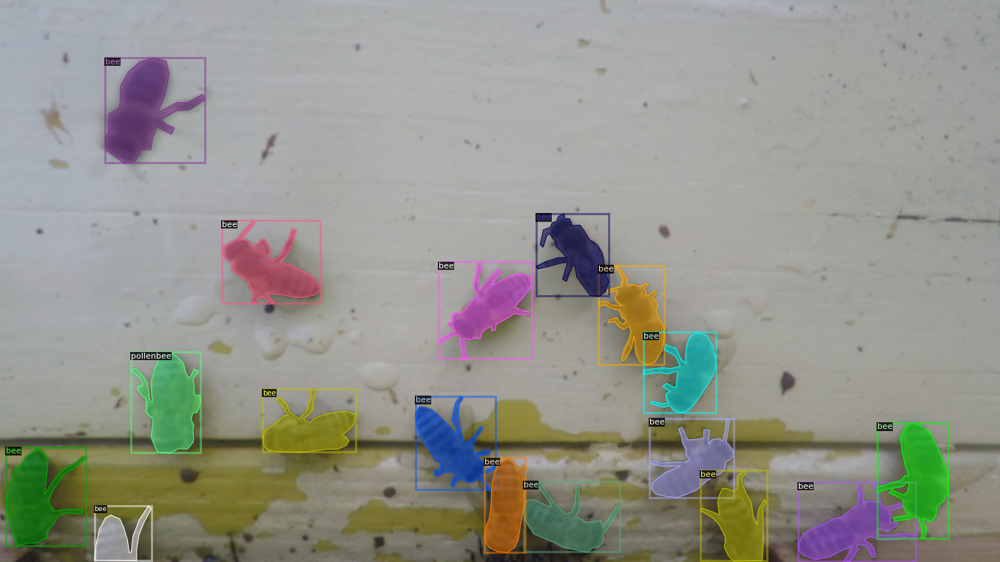

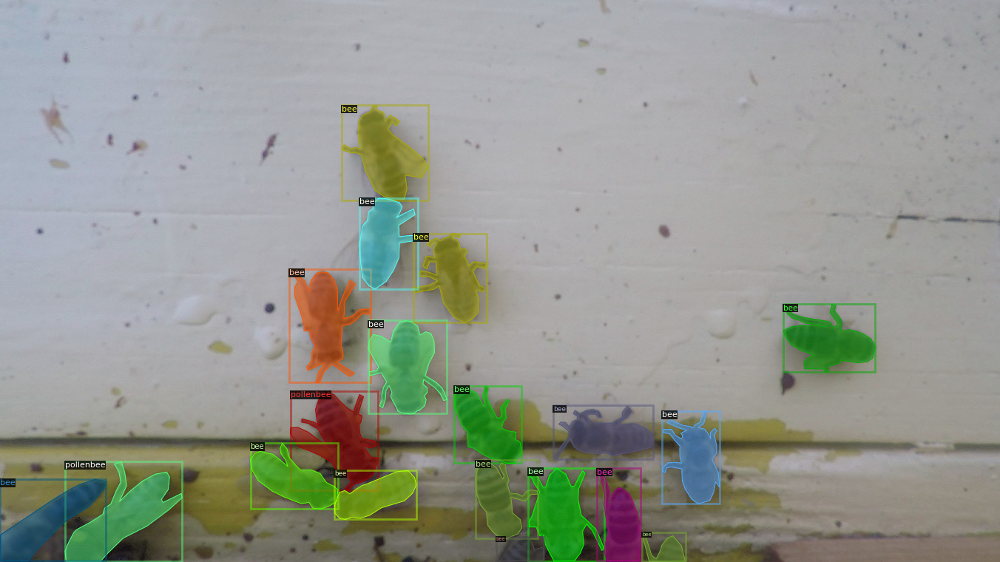

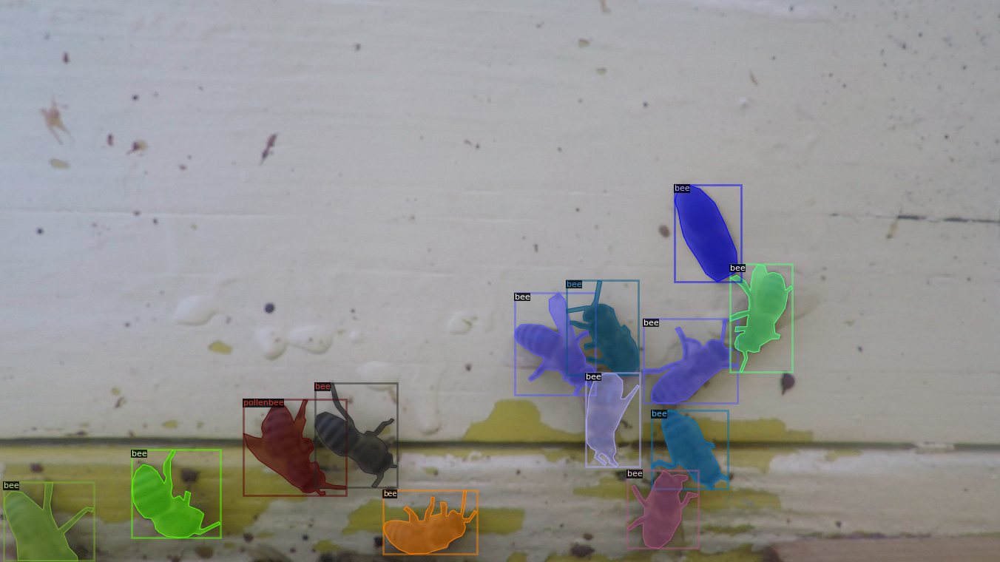

In [7]:
dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_train_dicts = DatasetCatalog.get("my_dataset_train")
dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
dataset_test_dicts = DatasetCatalog.get("my_dataset_test")

for d in random.sample(dataset_train_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=dataset_train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Train

Description!


## Configuration
Set the following configuration parameters for training:
* MODEL_ZOO_CONFIG_FILE -> 
* NUM_OF_WORKERS ->
* IMAGES_PER_BATCH ->
* BASE_LR ->
* MAX_ITERATIONS ->
* BATCH_SIZE_PER_IMAGE ->

In [8]:
MODEL_ZOO_CONFIG_FILE="COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
NUM_OF_WORKERS=2
IMAGES_PER_BATCH=2
BASE_LR = 0.0025
MAX_ITERATIONS = 300
BATCH_SIZE_PER_IMAGE = 128
NUM_CLASSES = 2

In [9]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(MODEL_ZOO_CONFIG_FILE))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = NUM_OF_WORKERS
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(MODEL_ZOO_CONFIG_FILE)  # Let training initialize from model
cfg.SOLVER.IMS_PER_BATCH = IMAGES_PER_BATCH
cfg.SOLVER.BASE_LR = BASE_LR  # pick a good LR
cfg.SOLVER.MAX_ITER = MAX_ITERATIONS
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = BATCH_SIZE_PER_IMAGE   # (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[02/14 17:26:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:08, 22.2MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[02/14 17:27:06 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:345: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:345: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:217: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/

[02/14 17:27:17 d2.utils.events]:  eta: 0:02:24  iter: 19  total_loss: 2.97  loss_cls: 1.093  loss_box_reg: 0.8558  loss_mask: 0.6882  loss_rpn_cls: 0.2776  loss_rpn_loc: 0.0744  time: 0.5107  data_time: 0.0407  lr: 4.9952e-05  max_mem: 2675M
[02/14 17:27:27 d2.utils.events]:  eta: 0:02:14  iter: 39  total_loss: 2.494  loss_cls: 0.772  loss_box_reg: 0.9109  loss_mask: 0.6508  loss_rpn_cls: 0.06813  loss_rpn_loc: 0.08017  time: 0.5162  data_time: 0.0062  lr: 9.9902e-05  max_mem: 2675M
[02/14 17:27:37 d2.utils.events]:  eta: 0:02:04  iter: 59  total_loss: 2.162  loss_cls: 0.6055  loss_box_reg: 0.897  loss_mask: 0.5716  loss_rpn_cls: 0.04852  loss_rpn_loc: 0.06567  time: 0.5180  data_time: 0.0063  lr: 0.00014985  max_mem: 2675M
[02/14 17:27:48 d2.utils.events]:  eta: 0:01:54  iter: 79  total_loss: 1.918  loss_cls: 0.518  loss_box_reg: 0.8842  loss_mask: 0.4418  loss_rpn_cls: 0.02391  loss_rpn_loc: 0.06552  time: 0.5222  data_time: 0.0054  lr: 0.0001998  max_mem: 2675M
[02/14 17:27:59 d2.u

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Result
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [10]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

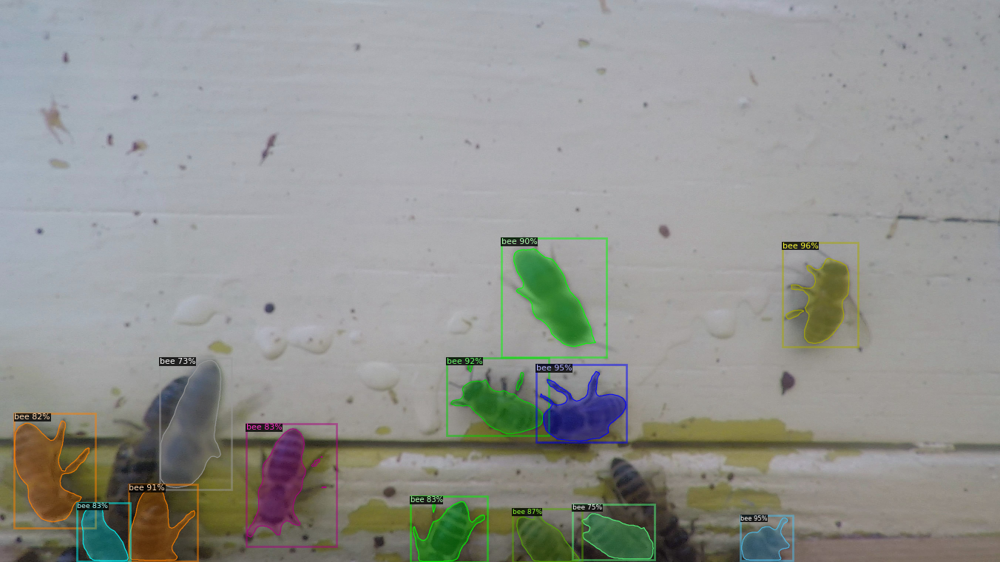

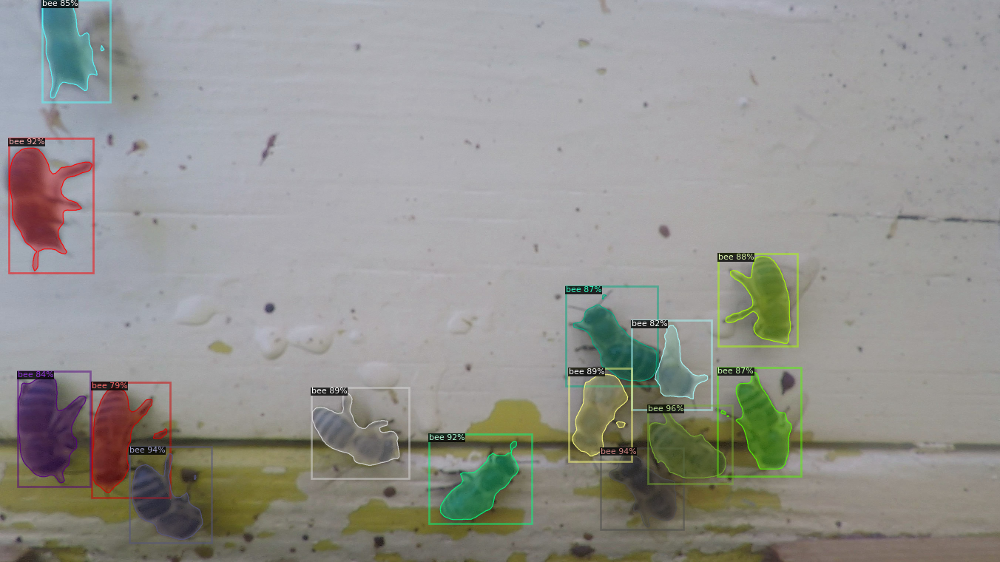

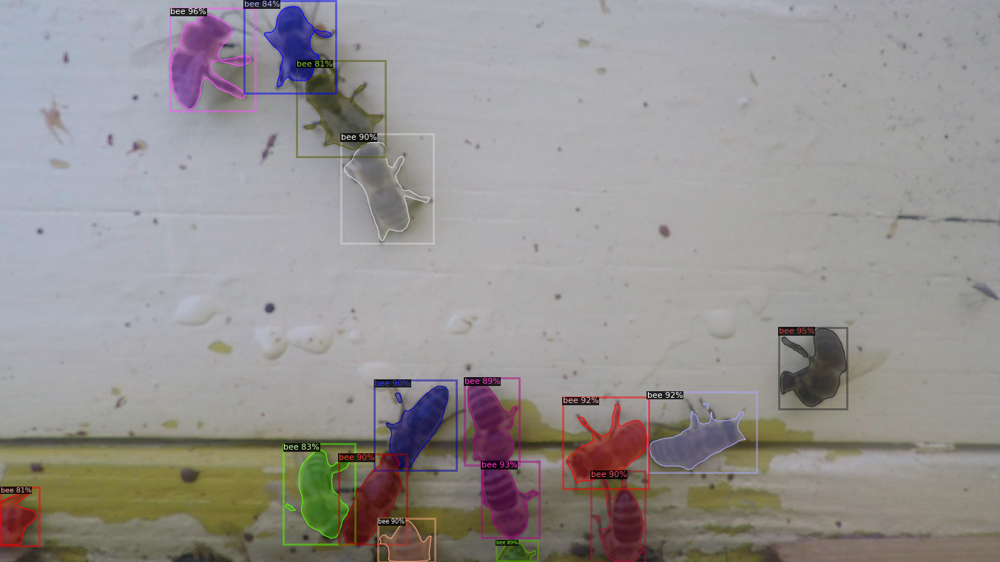

In [12]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_test_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=dataset_test_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", ("bbox", "segm"), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [02/14 17:32:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/14 17:32:07 d2.data.datasets.coco]: Loaded 12 images in COCO format from ./data/top/test/trainval.json
[02/14 17:32:07 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    bee     | 193          | pollenbee  | 13           |
|            |              |            |              |
|   total    | 206          |            |              |
[02/14 17:32:07 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/14 17:32:07 d2.data.common]: Serializing 12 elements to byte tensors and concatenating them all ...
[02/14 17:32:07 d2.data.common]: Serialized dataset takes 0.16 MiB
[02/14 17:32:07 d2.evaluation.eva

## Test

Now we will use trained model on some sample video.

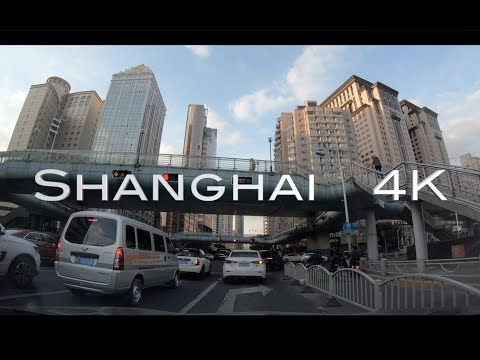

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("ll8TgCZ0plk", width=500)
display(video)

In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')